In [1]:
import os
import sys
sys.path.append("../models/")
sys.path.append("../helpers/")

import cv2
import numpy as np

import matplotlib.pyplot as plt

from gradient_vector_flow import _getEdgeMap, _calcGradient, GVFSnake

In [9]:
def drawVectorField(image, grad, gvf):
    # Define plot components
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
    
    # Set title
    axes[0].set_title("edge map gradient")
    axes[1].set_title("gradient vector flow")
    
    # Get input dimensions
    height, width, _ = image.shape
    
    # Grid indice
    ii, jj = np.meshgrid(range(0, height, 5),
                         range(0, width, 5),
                         indexing="ij")

    # Get scale values
    scale_grad = 20.*np.sqrt(np.max(grad[0]**2. + grad[1]**2))
    scale_gvf = 20.*np.sqrt(np.max(gvf[0]**2. + gvf[1]**2))     
    
    # Plot
    axes[0].imshow(image, cmap="gray")
    axes[1].imshow(image, cmap="gray")
    axes[0].quiver(ii, jj, grad[0][jj, ii], -grad[1][jj, ii], scale=scale_grad, color="blue", headwidth=5)
    axes[1].quiver(ii, jj, gvf[0][jj, ii], -gvf[1][jj, ii], scale=scale_gvf, color="red", headwidth=5)

In [20]:

def draw(filepath):
    # Load image
    base_image = cv2.imread(os.path.join("..", "assets", filepath))
    
    # Define new dimensions (width, height)
    new_width  = 512
    new_height = 512
    
    # Resize the image
    base_image = cv2.resize(base_image, (new_width, new_height))
    base_image = base_image.astype(np.uint8)

    #? plt.imshow(base_image)
    
    # Normalize image domain
    image = base_image[..., 0]
    norm = (image - image.min())/(image.max() - image.min())

    # Evaluate image energies
    edge = _getEdgeMap(norm)

    # Evaluate gradient of edge map
    fx, fy = _calcGradient(edge)

    # Get GVF
    model = GVFSnake()
    gx, gy = model.getGradientVectorFlow(fx, fy)

    # Plot
    drawVectorField(base_image, (fx, fy), (gx, gy))
    
    
    
    ## GVF Snake model

    # Add seed points
    seed = np.zeros_like(base_image[..., 0])
    seed[50:400, 50:300] = 1

    # Run
    _, contour = model.run(base_image[..., 0], seed)

    # Plot
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
    axes[0].imshow(base_image)
    axes[1].scatter(contour[:, 1], contour[:, 0], color="blue")
    axes[1].plot(contour[:, 1], contour[:, 0], color="blue")
    axes[1].imshow(base_image)

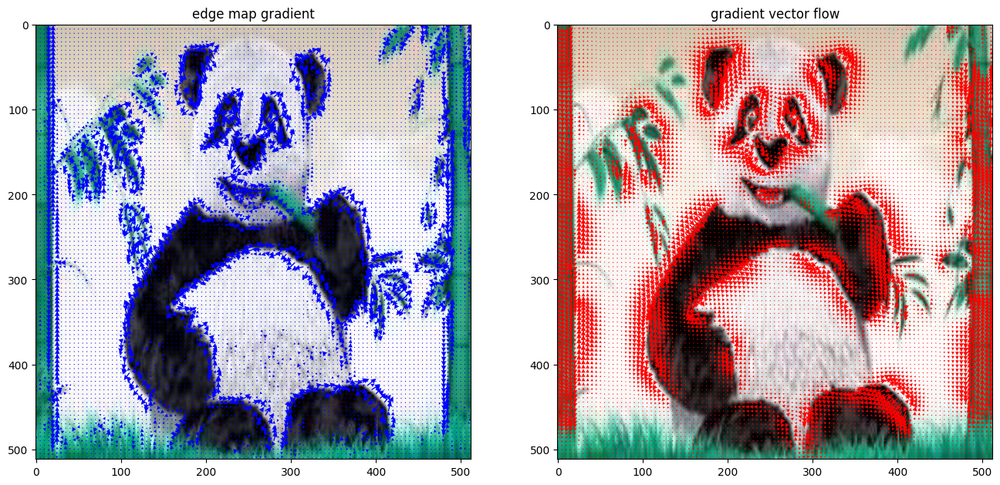

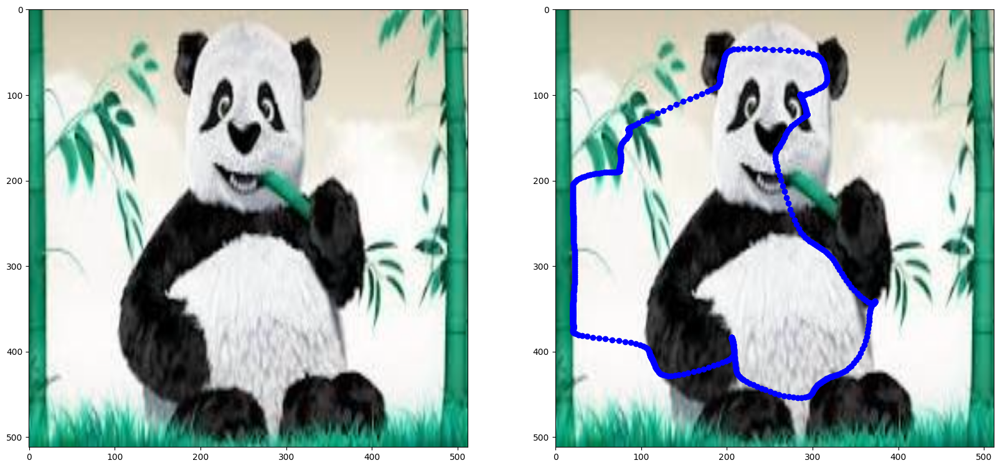

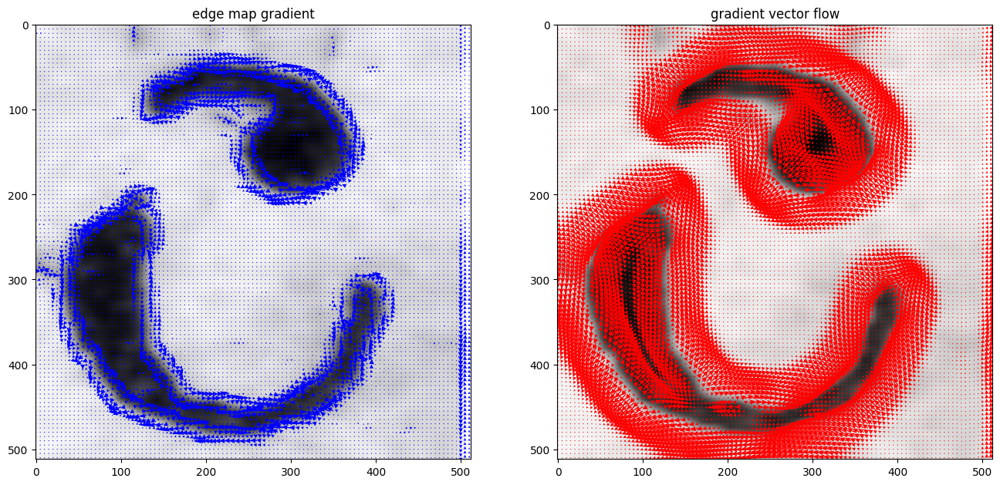

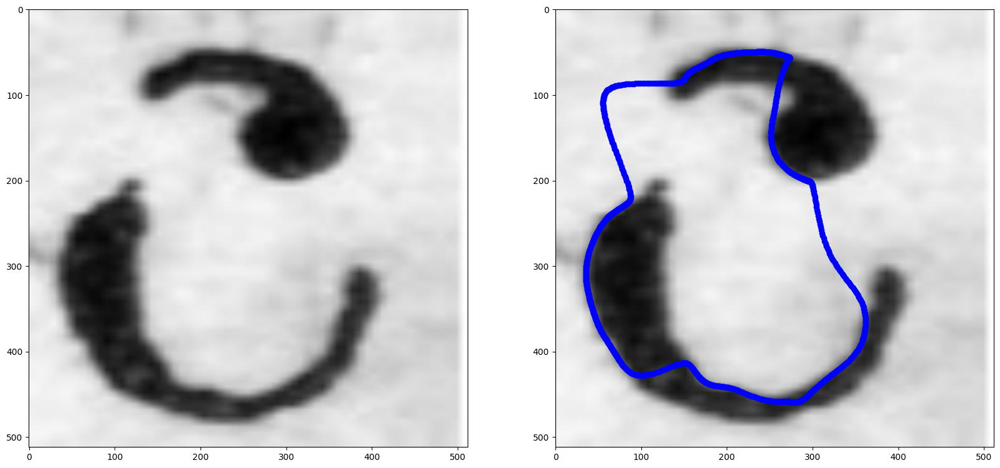

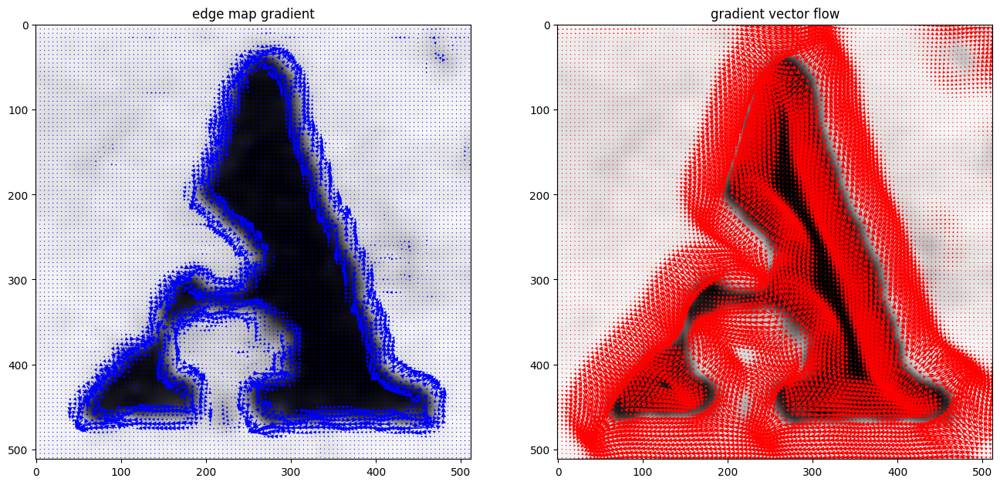

...

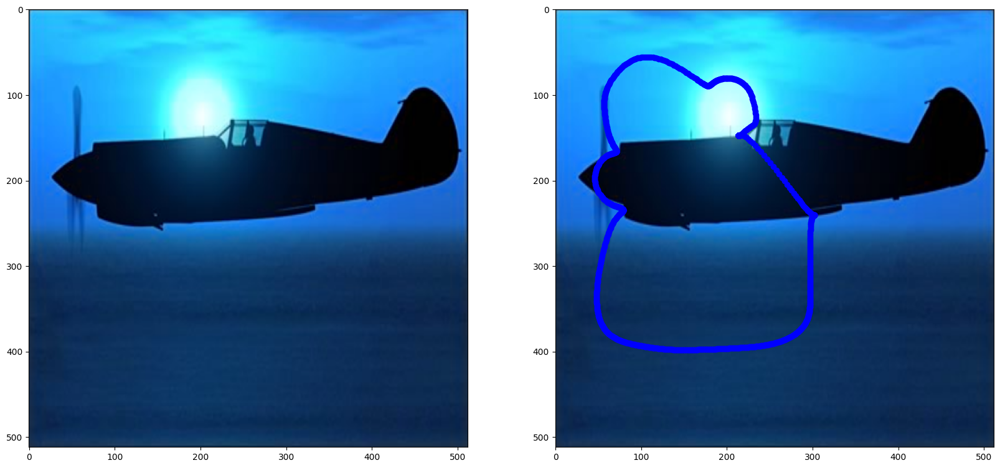

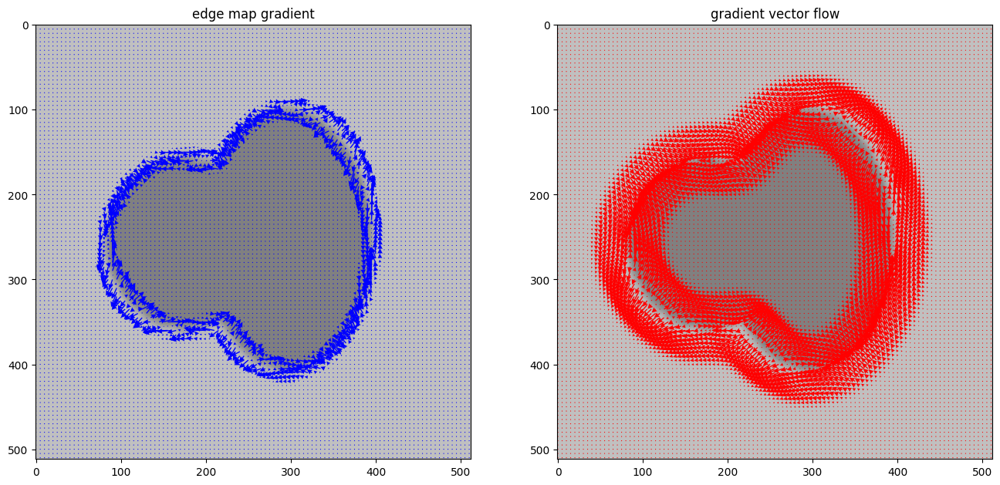

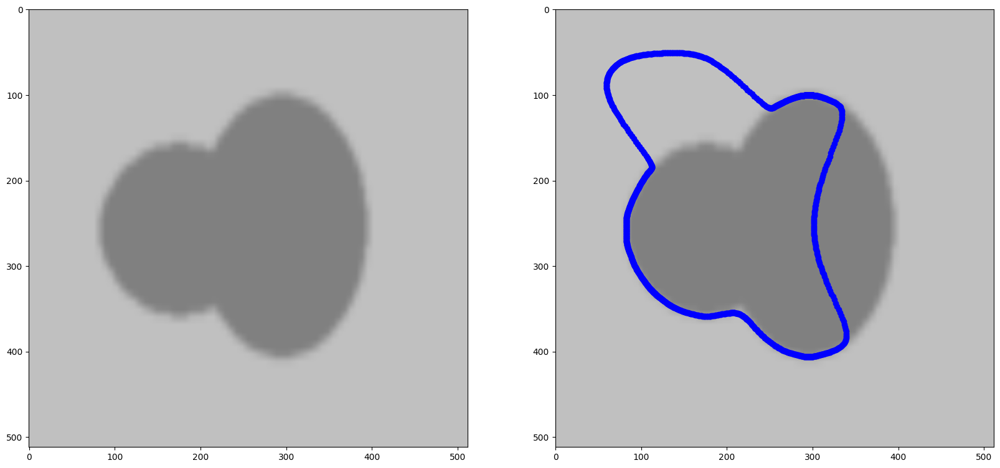

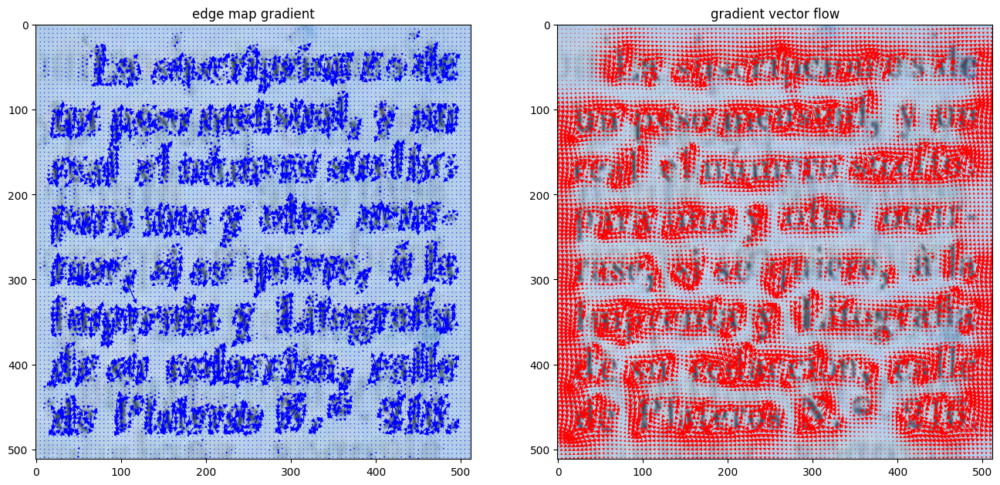

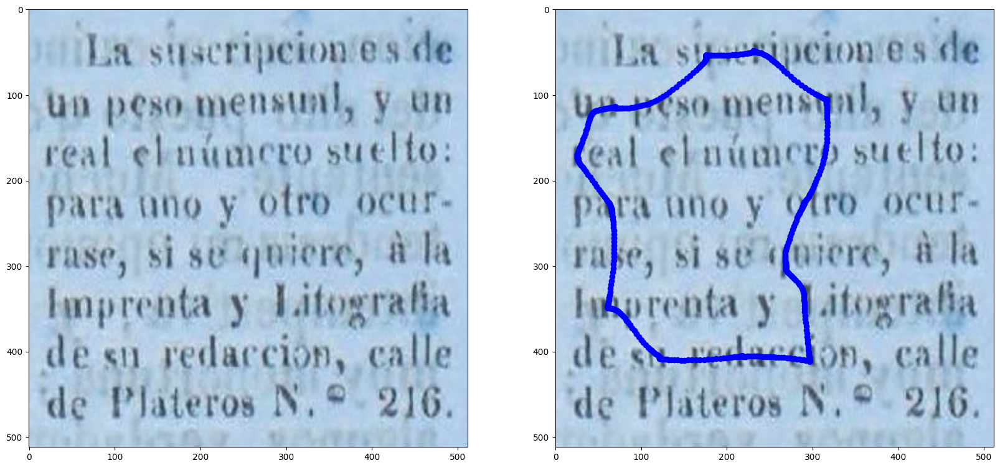

In [21]:
filenames = ["bear.jpg", "car_2.bmp", "car_3.bmp", "car_4.bmp", "fighter.jpg", "gourd.bmp", "hist_0.jpg"]
# filenames = ["bear.jpg", "car_2.bmp"]
for filename in filenames:
    filepath = os.path.join("..", "assets", filename)
    draw(filepath)